OPENCV BASICS

In the following sections we will learn

*  how to read,display and write images to a path
*  pixel representation of images
*  the different colorspaces
*  basics of convulation and filters

and finally a mini project where we make use of all the above information and some extra knowledge (which will be explained as well :) ).

But before that we will clone the Github repo CVI-Summer-School, make it the current directory. It has two folders
* Sample Image: which we will be using to show the commands and functions.
* Tasks: which has the necessary files and images to do the mini tasks.

In [ ]:
!pwd

/content


In [ ]:
!git clone https://github.com/Ashtrix19/CVI-Summer-School.git

Cloning into 'CVI-Summer-School'...
remote: Enumerating objects: 64, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 64 (delta 24), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (64/64), done.


In [ ]:
%cd /content/CVI-Summer-School
!ls

/content/CVI-Summer-School
 README.md  'Sample Image'   Tasks


###**Reading,Displaying and Writing Image to a path:**

The functions that we will be using to do the above task are



1.   cv2.imread(file_path,flag):
     This function is used to read the image at the file path. The flag value 
     is used to tell the colorspace in which the image is going to be read.

     ```
flag=0 : image is read in greyscale
flag=1 : image is read as a BGR image
```


2.   cv2.imwrite(file_path,variable_name):
     This function is used to write the image stored in the variable name to   the file path.
     
      ```
       variable_name= name of the variable that is holding the image
     ```

3.   cv2.waitKey(delay):
     Waits before closing the image window

     ```
delay=time for which the window waits before automatically closing(in milliseconds)
delay=0 : the window will wait for the user to press a key before closing
```

4.   cv2.imshow(title,variable_name):
     This function is used to show the image that is stored in the variable name
     However, collab crashes if we try using cv2.imshow(). Instead we use
  
     ```
from google.colab.patches import cv2_imshow
```
     Images can be displayed using cv2_imshow(variable_name) instead.
     










In [ ]:
#importing a few useful packages
#the numpy library contains functions that are optimised for handling multidimensional arrays
#cv2 is the openCV library that is used in Computer vision
#matplotlib is the python plotting library

import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

The image 1 is: [[[ 49  71 119]
  [ 49  69 116]
  [ 48  66 113]
  ...
  [ 20  21  17]
  [ 23  24  22]
  [ 22  23  21]]

 [[ 47  69 117]
  [ 48  68 115]
  [ 51  70 115]
  ...
  [ 27  28  24]
  [ 26  27  25]
  [ 25  26  24]]

 [[ 44  66 114]
  [ 48  68 115]
  [ 52  71 116]
  ...
  [ 34  35  31]
  [ 31  32  28]
  [ 29  30  26]]

 ...

 [[  7   4   0]
  [  4   1   0]
  [  3   1   0]
  ...
  [ 25  90  64]
  [ 22  87  61]
  [ 22  87  61]]

 [[  5   1   0]
  [ 13  10   6]
  [  2   0   0]
  ...
  [ 27  93  64]
  [ 25  91  62]
  [ 25  91  62]]

 [[  5   1   0]
  [ 17  14  10]
  [  8   4   3]
  ...
  [ 26  92  63]
  [ 27  93  64]
  [ 27  93  64]]] 

The image 2 is: [[ 69  70  72 ...  60  60  60]
 [ 69  70  72 ...  60  58  58]
 [ 69  70  71 ...  59  56  56]
 ...
 [146 145 143 ... 160 165 165]
 [148 146 144 ... 152 156 156]
 [150 148 146 ... 147 147 147]]


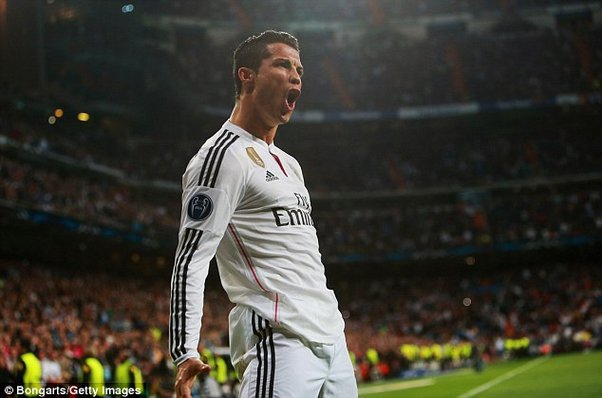

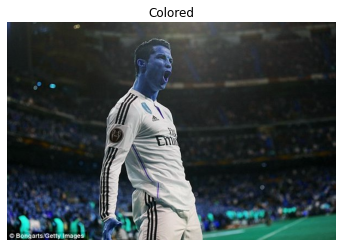

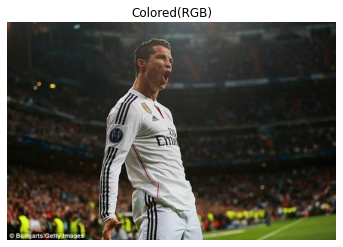

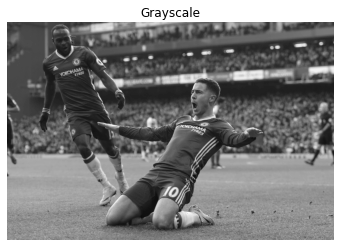

In [ ]:
img_1=cv2.imread("Sample Image/CR7.jpg",1)
img_2=cv2.imread("Sample Image/Hazard.jpg",0)
print("The image 1 is:",img_1,"\n")
print("The image 2 is:",img_2)
img_3=cv2.cvtColor(img_1,cv2.COLOR_BGR2RGB)
cv2_imshow(img_1)
cv2.waitKey(0)
#cv2_imshow(img_2)
#cv2.waitKey(0)
plt.figure()
plt.imshow(img_1),plt.title("Colored"),plt.axis("off")
plt.figure()
plt.imshow(img_3),plt.title("Colored(RGB)"),plt.axis("off")
plt.figure()
plt.imshow(img_2,cmap='gray'),plt.title("Grayscale"),plt.axis("off")
plt.show()

### **Coverting between the colorspaces**

Often we need to convert images from one colorspace to another colorspace during image processing as certain features are easier to extract in the other colorspace.

The functions that we will be using to do this is

cv2.cvtColor(input_image,flag)



```
flag :  specifies the type of conversion
cv2.COLOR_GRAY2BGR : converts the grayscale image to BGR image
cv2.COLOR_BGR2GRAY : converts the BGR image to a greyscale image
cv2.COLOR_BGR2HSV  : converts the BGR image to a HSV image
cv2.COLOR_HSV2BGR  : converts the HSV image to a BGR image
```
Below we will try to read a new image from the file Sample Image in BGR and grayscale and try to convert it to the other colorspaces.


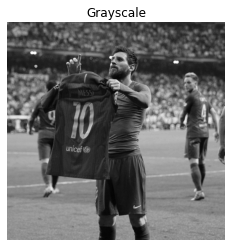

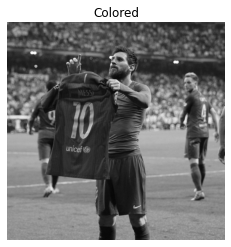

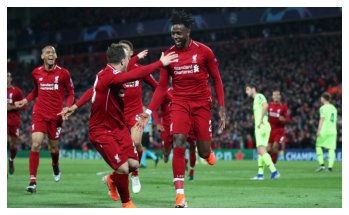

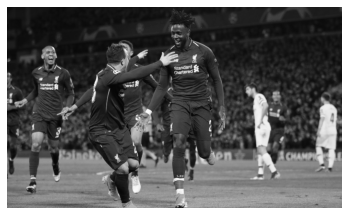

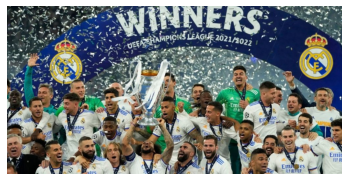

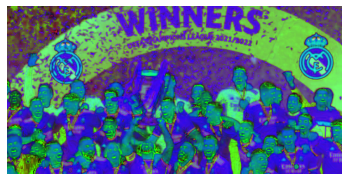

In [ ]:
g_img=cv2.imread("Sample Image/LM.jpg",0)
bgr_img=cv2.imread("Sample Image/origi.jpeg",1)
rgb_img=cv2.cvtColor(bgr_img,cv2.COLOR_BGR2RGB)
bgr_img1=cv2.imread("Sample Image/RMA.jpg",1)
rgb_img1=cv2.cvtColor(bgr_img1,cv2.COLOR_BGR2RGB)
#cv2_imshow(g_img)
#cv2_imshow(bgr_img)
#cv2_imshow(bgr_img1)
img_bgr=cv2.cvtColor(g_img,cv2.COLOR_GRAY2RGB)
#cv2_imshow(img_bgr)
img_g=cv2.cvtColor(bgr_img,cv2.COLOR_BGR2GRAY)
#cv2_imshow(img_g)
img_hsv=cv2.cvtColor(bgr_img1,cv2.COLOR_BGR2HSV)
#cv2_imshow(img_hsv)
plt.figure()
plt.imshow(g_img,cmap='gray'),plt.title("Grayscale"),plt.axis("off")
plt.figure()
plt.imshow(img_bgr),plt.title("Colored"),plt.axis("off")
plt.figure()
plt.imshow(rgb_img),plt.axis("off")
plt.figure()
plt.imshow(img_g,cmap='gray'),plt.axis("off")
plt.figure()
plt.imshow(rgb_img1),plt.axis("off")
plt.figure()
plt.imshow(img_hsv),plt.axis("off")
plt.show()


###**Implementing 2D convolution on a matrix**

In this section we will see functions to apply convolution to the matrices by experimenting with different filters to apply to the images

The functions to be used are 

1. np.array(matrix,datatype): 
   This function is used to create an array/matrix of the specified datatype.

   ```
matrix : the matrix with the values that is to be created
         as the array.
datatype : the datatype in which the array is to be created
           eg. np.float32, np.int32 , np.complex128
```

2. cv2.filter2D(src_matrix, depth_out_matrix, kernel)
   This function is used to apply the kernel to the source matrix i.e apply the filter to the image.

   ```
src_matrix : the source matrix i.e the image
depth_out_matrix : the depth of the matrix that is going to
                   be outputted. Use -1 for the output matrix
                   depth to be same as the source matrix
                   (useful for 2D convolution on 3D matrix)
kernel : the filter matrix that is going to be used
```




Some of the filters that you can try are 



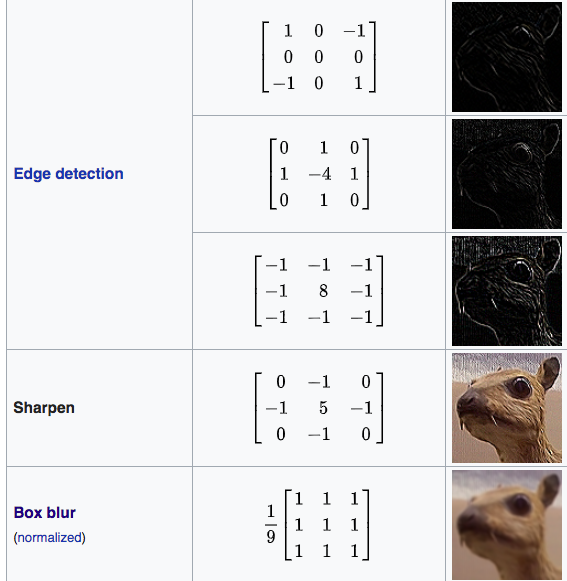

[[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]
[[ 0 -1  0]
 [-1  5 -1]
 [ 0 -1  0]]


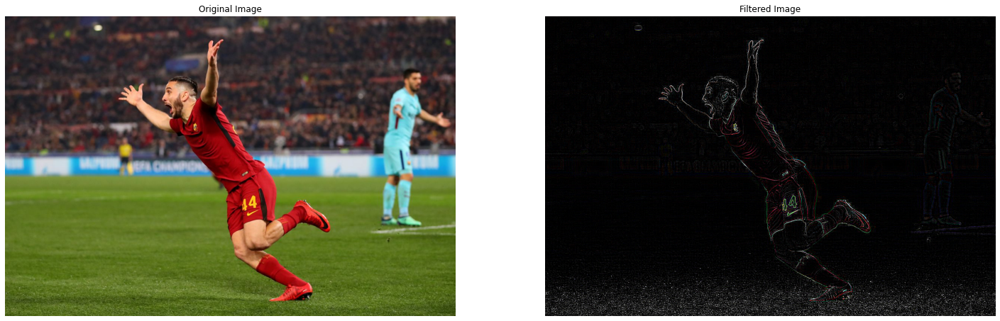

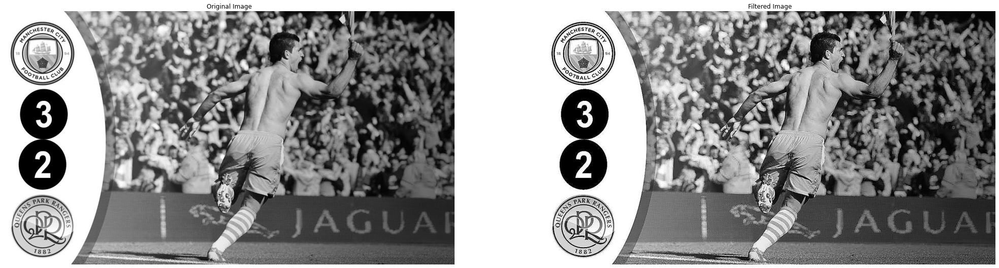

In [ ]:
src_img1=cv2.imread("Sample Image/Roma.jpg",1)
src_img_cvt=cv2.cvtColor(src_img1,cv2.COLOR_BGR2RGB)
src_img2=cv2.imread("Sample Image/Aguero.jpg",0)
k1=np.array(([-1,-1,-1],[-1,8,-1],[-1,-1,-1]),np.int32)
print(k1)
k2=np.array(([0,-1,0],[-1,5,-1],[0,-1,0]),np.int32)
print(k2)
output_img1=cv2.filter2D(src_img_cvt,-1,k1)
output_img2=cv2.filter2D(src_img2,-1,k2)
#cv2_imshow(src_img1)
#cv2_imshow(output_img1)
#cv2_imshow(src_img2)
#cv2_imshow(output_img2)
plt1=plt.figure(figsize=(25,25))
plt.subplot(121),plt.imshow(src_img_cvt),plt.title("Original Image"),plt.axis("off")
#plt2=plt.figure(figsize=(7,7))
plt.subplot(122),plt.imshow(output_img1),plt.title("Filtered Image"),plt.axis("off")
plt.show()
plt2=plt.figure(figsize=(35,35))
plt.subplot(221),plt.imshow(src_img2,cmap='gray'),plt.title("Original Image"),plt.axis("off")
plt.subplot(222),plt.imshow(output_img2,cmap='gray'),plt.title("Filtered Image"),plt.axis("off")
plt.show()

#**MORPHOLOGICAL TRANSFORMATIONS**

The functions that we will use for various morphological transformations are:

###1) Erosion:

```
cv2.erode(src,kernel,iterations)
```
**Parameters:**

*  src - Input image in **Binary**
*  kernel - The kernel used for erosion.
*  iterations - The number of times you want the convolution to happen. Multiple erosions can be combined into a single function using this argument. By default iterations = 1.

---
###2) Dilation:

```
cv2.dilate(src,kernel,iterations)
```
**Parameters:**

*  src - Input image in **Binary**
*  kernel - The kernel used for dilation.
*  iterations - The number of times you want the convolution to happen. Multiple dilations can be combined into a single function using this argument. By default iterations = 1.

---



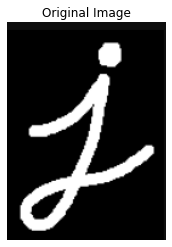

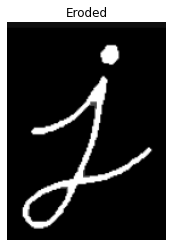

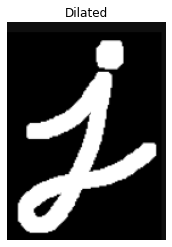

In [ ]:
img=cv2.imread("Sample Image/j.png")
kernel=np.ones((5,5))
erosion=cv2.erode(img,kernel,1) #see what happens when you increase iterations
dilation=cv2.dilate(img,kernel,1) #see what happens when you increase iterations

#cv2_imshow(img)
#cv2_imshow(erosion)
#cv2_imshow(dilation)

plt.figure()
plt.imshow(img,cmap='gray'),plt.title("Original Image"),plt.axis("off")
plt.figure()
plt.imshow(erosion,cmap='gray'),plt.title("Eroded"),plt.axis("off")
plt.figure()
plt.imshow(dilation,cmap='gray'),plt.title("Dilated"),plt.axis("off")
plt.show()

## 3) Other Morphological Transformations

## Opening

Opening is just erosion followed by dilation. It is useful in removing noise as seen in the image below.

![alt text](https://docs.opencv.org/3.0-beta/_images/opening.png)

## Closing

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

![alt text](https://docs.opencv.org/3.0-beta/_images/closing.png)

## Morphological Gradient

It is just the difference between dilation and erosion of an image. The result will look like the outline of the object.

![alt text](https://docs.opencv.org/3.0-beta/_images/gradient.png)

## Top Hat

It is the difference between input image and opening of the image. Below example is done for a 9x9 kernel.

![alt text](https://docs.opencv.org/3.0-beta/_images/tophat.png)

## Black Hat

It is the difference between the closing of the input image and input image.

![alt text](https://docs.opencv.org/3.0-beta/_images/blackhat.png)

The function: 

```
cv2.morphologyEx(img, operation, kernel)
```
**Parameters:**

*  img - Input image in **Binary**
*  transform - The type of operation can take the following arguments:
  *  cv2.MORPH_OPEN to implement opening.
  *  cv2.MORPH_CLOSE to implement closing.
  *  cv2.MORPH_GRADIENT to implement morphological gradient.
  *  cv2.MORPH_TOPHAT to implement top hat.
  *  cv2.MORPH_BLACKHAT to implement black hat.
*  kernel - The kernel to be used for the transform.


---


##Application of Top Hat and Black Hat

The top-hat filter is used to enhance bright objects of interest in a dark background. The black-hat operation is used to do the opposite, enhance dark objects of interest in a bright background.

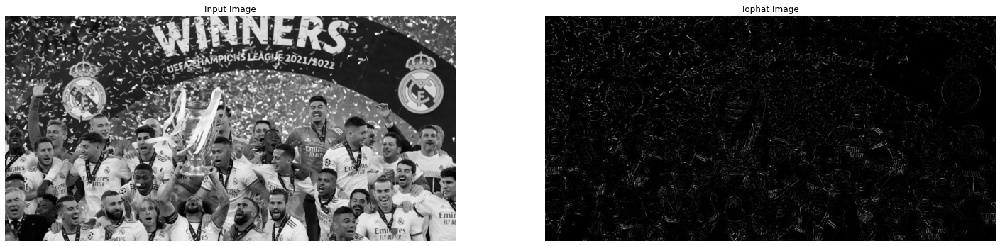

In [ ]:
filterSize =(3, 3)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,filterSize)
input_image = cv2.imread("Sample Image/RMA.jpg")
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

# Applying the Top-Hat operation
tophat_img = cv2.morphologyEx(input_image,cv2.MORPH_TOPHAT,kernel)

plt1=plt.figure(figsize=(25,25))
plt.subplot(121),plt.imshow(input_image,cmap='gray'),plt.title("Input Image"),plt.axis('off')
plt.subplot(122),plt.imshow(tophat_img,cmap='gray'),plt.title("Tophat Image"),plt.axis('off')
plt.show()


As you can observe in the above image, the very small details are enhanced and taken out using the Top-Hat operation. Hence, it is useful in observing the minor details of the inputs when are present as light pixels on a dark background.

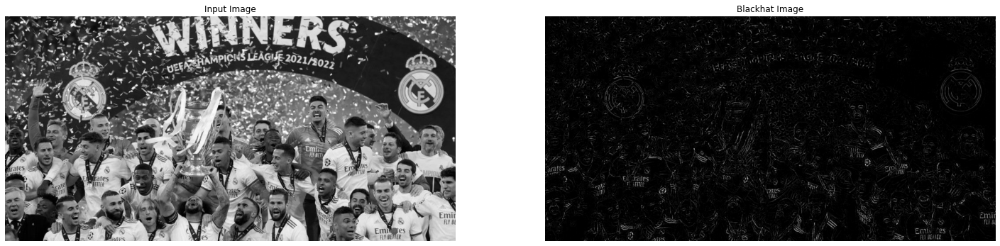

In [ ]:
filterSize =(3, 3)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,filterSize)

input_image = cv2.imread("Sample Image/RMA.jpg")
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
  
blackhat_img = cv2.morphologyEx(input_image, cv2.MORPH_BLACKHAT,kernel)
plt1=plt.figure(figsize=(25,25))
plt.subplot(121),plt.imshow(input_image,cmap='gray'),plt.title("Input Image"),plt.axis('off')
plt.subplot(122),plt.imshow(blackhat_img,cmap='gray'),plt.title("Blackhat Image"),plt.axis('off')
plt.show()

Here in this image, all the objects which are DARK on a WHITE background are highlighted due to the Black Hat transformation applied to the input image.

#**EDGE DETECTION**

One of the most basic and important tasks in image processing is edge detection.
You can easily notice that in an edge, the pixel intensity changes in a notorious way. A great way to express changes is to use derivative/gradients. Therefore a high change in gradient would imply a major jump in pixel values, therefore tell the presence of an edge.

One of the ways to compute gradients is using the Sobel operator.

###**SOBEL**

The Sobel Operator is a discrete differentiation operator. It computes an approximation of the gradient of an image intensity function.
The Sobel Operator combines Gaussian smoothing and differentiation.

Assuming that the image to be operated is I:

We calculate two derivatives:

**Horizontal changes**: This is computed by convolving I with a kernel of odd size as given below. For a kernel size of 3, $ G{x} $ would be computed as the convolution of the following matrix with I.

\begin{bmatrix}
-1 & 0 & +1  \\
-2 & 0 & +2  \\
-1 & 0 & +1
\end{bmatrix}

**Vertical changes**: This is computed by convolving I with a kernel of odd size as given below. For a kernel size of 3, $G{y}$ would be computed as the convolution of the following matrix with I.

\begin{bmatrix}
-1 & -2 & -1  \\
0 & 0 & 0  \\
+1 & +2 & +1
\end{bmatrix}

At each point of the image we calculate an approximation of the gradient at that point by combining both the results above:

$$ \begin{equation*} G = \sqrt{ G_{x}^{2} + G_{y}^{2} }\end{equation*} $$

Although sometimes the following simpler equation can also be used:

$$ \begin{equation*} G = |G{x}| + |G{y}| \end{equation*} $$

Functions that we will use

1. cv2.Sobel(src,ddepth,xorder,yorder,ksize):
   
   ```
src: source image
ddepth: depth of the output image, the following combinations of depth are
        supported:
    *  CV_8U
    *  CV_16U/CV_16S
    *  CV_32F
    *  CV_64F
xorder: order of the derivative x
yorder: order of the derivative y
ksize: size of the extended sobel kernel;it must be 1,3,5 or 7
```




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


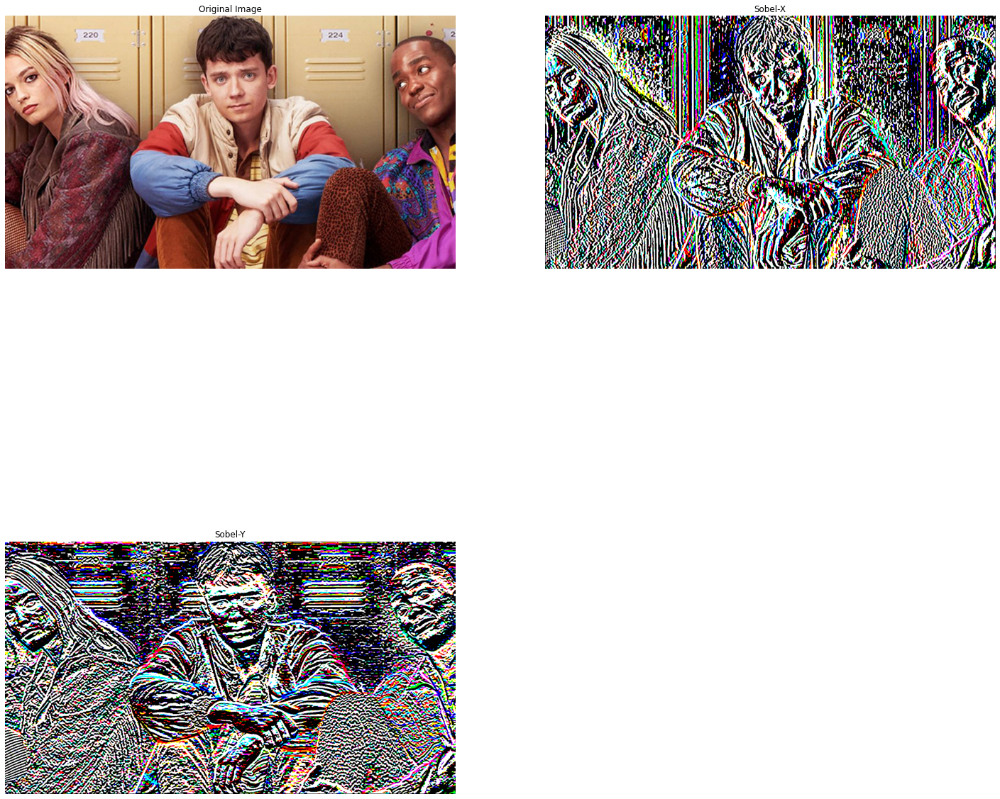

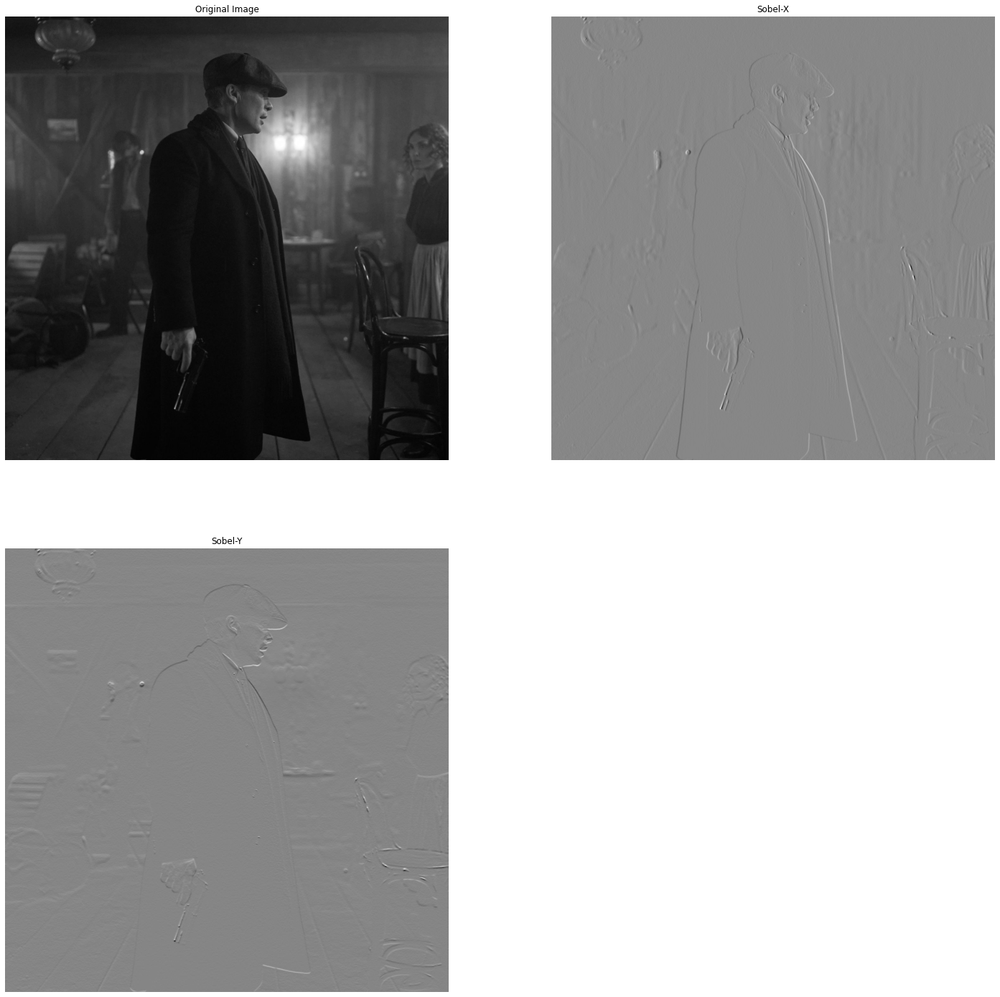

In [ ]:
src_image=cv2.imread("Sample Image/SE.jpg",1)
src_img_1=cv2.cvtColor(src_image,cv2.COLOR_BGR2RGB)
g_src_image=cv2.imread("Sample Image/PB.jpg",0)
img1=cv2.GaussianBlur(src_img_1,(3,3),0)
img2=cv2.GaussianBlur(g_src_image,(3,3),0)
#sobel operator on BGR image
sobelx=cv2.Sobel(img1,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img1,cv2.CV_64F,0,1,ksize=3)
#cv2_imshow(src_image)
#cv2_imshow(sobelx)
#cv2_imshow(sobely)
plt1=plt.figure(figsize=(25,25))
plt.subplot(221),plt.imshow(src_img_1),plt.title("Original Image"),plt.axis("off")
plt.subplot(222),plt.imshow(sobelx),plt.title("Sobel-X"),plt.axis("off")
plt.subplot(223),plt.imshow(sobely),plt.title("Sobel-Y"),plt.axis("off")
plt.show()
#sobel operator on grayscale image
sobelx_g=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely_g=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
#cv2_imshow(g_src_image)
#cv2_imshow(sobelx_g)
#cv2_imshow(sobely_g)
plt2=plt.figure(figsize=(25,25))
plt.subplot(221),plt.imshow(g_src_image,cmap='gray'),plt.title("Original Image"),plt.axis("off")
plt.subplot(222),plt.imshow(sobelx_g,cmap='gray'),plt.title("Sobel-X"),plt.axis("off")
plt.subplot(223),plt.imshow(sobely_g,cmap='gray'),plt.title("Sobel-Y"),plt.axis("off")
plt.show()


# Canny Edge Detector

The Canny edge detector is an edge detection operator that uses a multi-stage algorithm to detect a wide range of edges in images. It was developed by John F. Canny in 1986.

The Process of Canny edge detection algorithm can be broken down to 5 different steps:

1.   Apply Gaussian filter to smooth the image in order to remove the noise
2.   Find the intensity gradients of the image.
3.   Apply non-maximum suppression to get rid of spurious response to edge detection.
4.   Apply double threshold to determine potential edges.
5.   Track edge by hysteresis: Finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.


---

## 1) Gaussian filter

Since edge detection is susceptible to noise in the image, first step is to remove it with a 5x5 Gaussian filter. The Gaussian filter is applied to convolve with the image. This step will slightly smoothen the image to reduce the effects of obvious noise on the edge detector.

Given below is the 5×5 Gaussian filter generally used before implementing the Canny Edge Detection with a standard deviation of 1.4.

The asterisk below denotes a convolution operation.

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/efce20969e243d1ba3f34c2f7126041095bd4656)

**Note**: The gaussian filter won't be implicitly implemented on a call to the cv2.Canny() function. Hence, make sure that the image is filtered before passing it on to the Canny function.

---

## 2) Finding intensity gradient of the image

Smoothened image is then filtered with a Sobel kernel in both horizontal and vertical directions to get first derivative in horizontal direction ($G_x$) and vertical direction ($G_y$). From these two images, we can find edge gradient and direction for each pixel as follows:

![alt text](https://docs.opencv.org/3.0-beta/_images/math/a1d81c63db2a560ef2fc82222b7851257d1ef4a2.png)

The edge direction angle is then rounded to one of four angles representing vertical, horizontal and the two diagonals (0°, 45°, 90° and 135°). For instance θ in [0°, 22.5°] or [157.5°, 180°] is mapped to 0°.

After getting gradient magnitude and direction, a full scan of image is done to remove any unwanted pixels which may not constitute the edge. A threshold for the image gradients is set and only those pixels whose gradient magnitudes fall above this threshold are taken as edges.


---
## 3) Non-maximum suppression

Non-maximum suppression is an **edge thinning technique**. 
After applying gradient calculation, the edge extracted from the gradient value is still quite blurred. As minimal response is one of the important criterions for edge detection, there should only be one accurate response to the edge. Thus non-maximum suppression can help to suppress all the gradient values (by setting them to 0) except the local maxima, which indicate locations with the sharpest change of intensity value.

For this, every pixel is checked if it is a local maximum in the gradient direction.

The following algorithm is followed for each pixel in the gradient image.

*  Compare the edge strength of the current pixel with the edge strength of the pixel in the positive and negative gradient directions.
*  If the edge strength of the current pixel is the largest compared to both, the value will be preserved. Otherwise, the value will be suppressed.

It is by logic, we observe that the **gradient direction is always normal to the edge**.

![alt text](https://docs.opencv.org/3.0-beta/_images/nms.jpg)

Point A is on the edge (in vertical direction). Point B and C are in gradient directions. So point A is checked with point B and C to see if it forms a local maximum. If so, it is considered for next stage, otherwise, it is suppressed (put to zero).

*  If the rounded gradient angle is 0° (i.e. the edge is in the north-south direction), the point will be considered to be on the edge if its gradient magnitude is greater than the magnitudes at pixels in the east and west directions.
*  If the rounded gradient angle is 90° (i.e. the edge is in the east-west direction) the point will be considered to be on the edge if its gradient magnitude is greater than the magnitudes at pixels in the north and south directions.
*  If the rounded gradient angle is 135° (i.e. the edge is in the northeast-southwest direction) the point will be considered to be on the edge if its gradient magnitude is greater than the magnitudes at pixels in the north west and south-east directions.
*  If the rounded gradient angle is 45° (i.e. the edge is in the north west–south east direction) the point will be considered to be on the edge if its gradient magnitude is greater than the magnitudes at pixels in the north east and south west directions.

Note that the sign of the direction is irrelevant, i.e. north–south is the same as south–north and so on.

In short, the result you get is a binary image with “thin edges” as shown below.

![alt text](http://ai.stanford.edu/~syyeung/cvweb/Pictures1/canny2.png)


---
## 4) Double thresholding

After application of non-maximum suppression, remaining edge pixels provide a more accurate representation of real edges in an image. However, some edge pixels remain that are caused by noise and color variation. In order to account for these spurious responses, it is essential to filter out edge pixels with a weak gradient value and preserve edge pixels with a high gradient value. 

This is accomplished by selecting upper and lower threshold values. 

*  If the pixel gradient is higher than the upper threshold, it is marked as a strong edge pixel. 
*  If the pixel gradient is between the two thresholds, it is marked as a weak edge pixel. 
*  If the pixel gradient value is below the lower threshold, it will be suppressed. 

The two threshold values are passed on as arguments while calling the Canny Edge Detector function.

It is recommended that the upper:lower ratio is maintained between 2:1 and 3:1 for good results.


---
## 5) Hysteresis

The strong edge pixels obtained from the above thresholding are accepted as "true-edges".

The weak edge pixels obtained from the above thresholding are classified as edges or non-edges based on their connectivity. If they are somehow connected to a strong edge pixel moving along the edge, they are considered to be "true-edges". Otherwise, they are also discarded.

So what we finally get are only the strong edges in the image.

![alt text](http://ai.stanford.edu/~syyeung/cvweb/Pictures1/canny3.png)

**Note**: The input image passed on to the Canny function must be a grayscale image. The output image of the Canny function will be a Boolean (binary) grayscale image.

The functions that we will use for canny edge detection are

1. cv2.GaussianBlur(src,ksize,sigmaX,sigmaY,bordertype)
   
   ```
src: source image
ksize: size of the kernel [height,width];the height and widht must
be odd number and can be different;if its [0,0] then it
is calculated from sigma values
sigmaX: standard deviation along the x axis
sigmaY: standard deviation along the y axis. If its 0 then its value
is same as sigmaX
bordertype: specifies image boundaries when kernel is applied on 
image boundaries
```
2. cv2.Canny(src,minval,maxval,ksize,L2gradient):
   

*   src – input image in **grayscale**.
*   minVal – lower threshold value for double thresholding.
*   maxVal – upper threshold value for double thresholding.
*   ksize – size of the Sobel kernel for finding gradients; default ksize==3.
*   L2gradient – specifies the equation for finding gradient magnitude; default L2gradient==False.

If L2gradient is $True$, it uses $ \begin{equation*} G = \sqrt{ G_{x}^{2} + G_{y}^{2} }\end{equation*} $   for finding gradient magnitude.

If L2gradient is $False$, it uses $ \begin{equation*} G = |G{x}| + |G{y}| \end{equation*} $    for finding gradient magnitude.


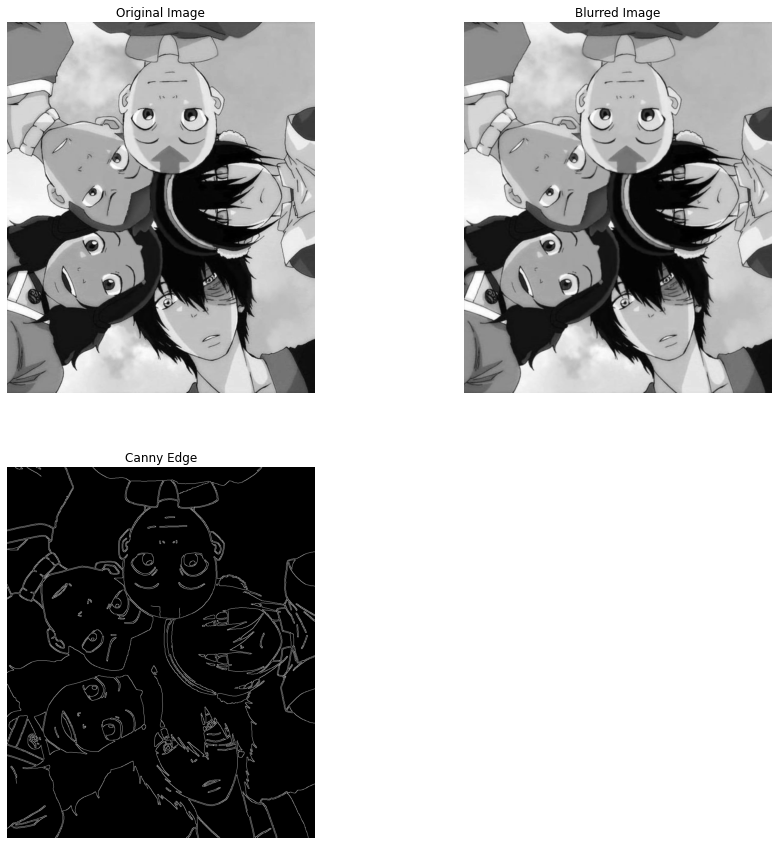

In [ ]:
img=cv2.imread("Sample Image/gaang.jpg",0)
blurred=cv2.GaussianBlur(img,(3,3),0)
canny=cv2.Canny(blurred,50,250,3)

#displaying the images
#cv2_imshow(img)
#cv2_imshow(blurred)
#cv2_imshow(canny)
plt1=plt.figure(figsize=(15,15))
plt.subplot(221),plt.imshow(img,cmap='gray'),plt.title("Original Image"),plt.axis('off')
plt.subplot(222),plt.imshow(blurred,cmap='gray'),plt.title("Blurred Image"),plt.axis('off')
plt.subplot(223),plt.imshow(canny,cmap='gray'),plt.title("Canny Edge"),plt.axis('off')
plt.show()

#**MINI TASK 1**
##CARTOONIFY AN IMAGE

In this mini task we will take an image and through a series of operations cartoonify that source image.
You can look at the series of images below,this is what we aim to achieve at the end of our code.

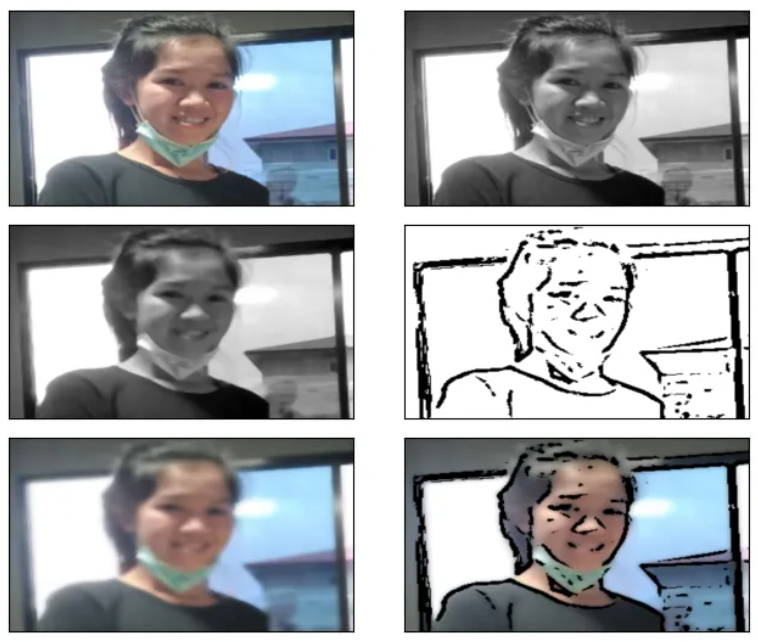

###The functions that we will be using are:

1. cv2.medianBlur( src, ksize,[dst]): This function smoothes an image using the median filter.

   **Parameters**
   *  src- source image
   *  ksize- size of the filter kernel
   *  dst- the output image;optional parameter

2. cv2.adaptiveThreshold(src,threshold,adaptive_method, blocksize,constant):
Simple thresholding uses the same threshold for every pixel,if it is greater than that threshold value it is set to a max value otherwise it is set to 0.
But in an image this might not be the case depending on the lighting condition. So adaptive thresholding decides on a threshold for a particular neighborhood of pixels and use that.

  **Parameters**
  * src- the source image
  * threshold- the maximum value that a pixel can be set to
  * adaptive_method- the method that will be used to calculate the threshold
    ```
cv2.ADAPTIVE_THRESH_MEAN_C : the threshold is the mean of the neighborhood area
minus the constant c
cv2.ADAPTIVE_THRESH_GAUSSIAN_C: the threshold is the gaussian weighted sum of
the neighborhood minus the constant C
```
  * blocksize- size of the neighborhood to be considered

3. cv2.bilateralFilter(src,d,sigma_color,sigma_space,border_type):
The function applies bilateral filtering to the input image,bilateralFilter can reduce unwanted noise very well while keeping edges fairly sharp. However, it is very slow compared to most filters.

  **Parameters**
  * src- source image
  * d-	Diameter of each pixel neighborhood that is used during filtering. If it is non-positive, it is computed from sigmaSpace.
  * sigmaColor-Filter sigma in the color space. A larger value of the parameter means that farther colors within the pixel neighborhood (see sigmaSpace) will be mixed together, resulting in larger areas of semi-equal color.
  * sigmaSpace-Filter sigma in the coordinate space. A larger value of the parameter means that farther pixels will influence each other as long as their colors are close enough (see sigmaColor ). When d>0, it specifies the neighborhood size regardless of sigmaSpace. Otherwise, d is proportional to sigmaSpace.
  * borderType-border mode used to extrapolate pixels outside of the image, see BorderTypes


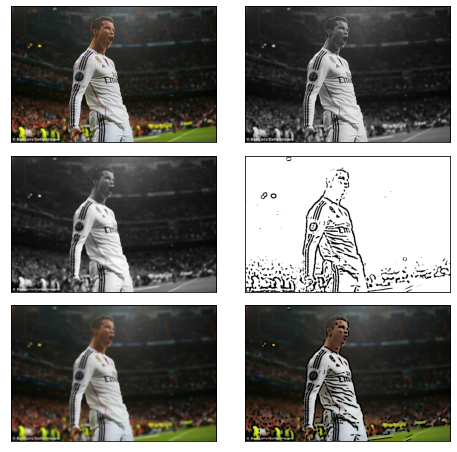

In [ ]:
src_image=cv2.imread("Sample Image/CR7.jpg",1)
src_img=cv2.cvtColor(src_image,cv2.COLOR_BGR2RGB)
gray_image=cv2.cvtColor(src_img,cv2.COLOR_RGB2GRAY)
smooth_gray_image=cv2.medianBlur(gray_image,5)
edges=cv2.adaptiveThreshold(smooth_gray_image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,9,9)
colorimage=cv2.bilateralFilter(src_img,9,300,300)
cartoon_image=cv2.bitwise_and(colorimage,colorimage,mask=edges)
#cv2_imshow(src_image)
#cv2_imshow(gray_image)
#cv2_imshow(smooth_gray_image)
#cv2_imshow(edges)
#cv2_imshow(colorimage)
#cv2_imshow(cartoon_image)
images=[src_img,gray_image,smooth_gray_image,edges,colorimage,cartoon_image]
fig, axes = plt.subplots(3,2, figsize=(8,8), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
  ax.imshow(images[i], cmap='gray')
plt.show()

#**MINI TASK 2**

In this task we will be detecting cars in a video using haar cascade classifiers.
Haar cascade is a machine learning based approach to do object detections using positive and negative images.Positive images are images that contain objects which we want the classifier to identify.Negative images are images that contain everything except the object which we want the classifier to detect.

In this task we will load a video,read the frames and draw rectangles around the cars if they are present in that frame.

We will be using cars.xml as the cascade classifier and cars.mp4 as the video source.

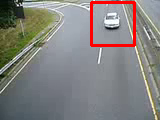

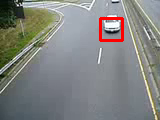

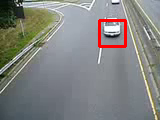

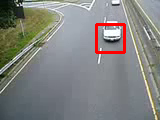

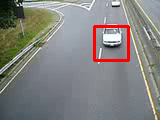

...

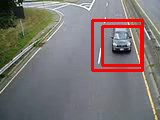

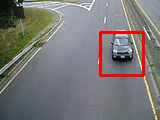

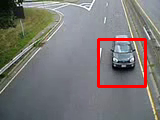

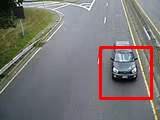

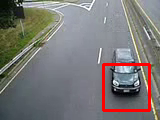

In [ ]:
cap = cv2.VideoCapture( 'Tasks/cars.mp4')

# Trained XML classifiers describes some features of some object we want to detect
car_cascade = cv2.CascadeClassifier( 'Tasks/cars.xml')

# loop runs if capturing has been initialized.
while True:
    # reads frames from a video
    ret, frames = cap.read()
    if ret==False:
      break
    # convert to gray scale of each frames
    gray = cv2.cvtColor(frames, cv2.COLOR_BGR2GRAY)
    # Detects cars of different sizes in the input image
    cars = car_cascade.detectMultiScale( gray, 1.1, 1)
    # To draw a rectangle in each cars
    for (x,y,w,h) in cars:
        cv2.rectangle(frames,(x,y),(x+w,y+h),(0,0,255),2)
        # Display frames in a window
        cv2_imshow(frames)
        frameSize = (500, 500)
        out = cv2.VideoWriter('Tasks/output_video.avi',cv2.VideoWriter_fourcc(*'DIVX'), 60, frameSize)
        for i in range(0,255):
          out.write(frames)

out.release()
    

cv2.destroyAllWindows()

In [ ]:
cap=cv2.VideoCapture("Tasks/output_video.avi")
if(cap.isOpened()==False):
  print("Error Opening file")

while(cap.isOpened()):
  ret,frame=cap.read()
  if ret==True:
    cv2_imshow(frame)
    if cv2.waitKey(25) & 0xFF == ord('q'):
      break

  else:
    break

cap.release()
cv2.destroyAllWindows()


##**DIY CODES**

Below I have given an incomplete codes for using the basic haar cascade face detection algorithm,which can be modified to detect eyes,noses and other facial features. I have uploaded the necessary haar cascade classifiers .xml files in the Tasks subfolder which you can check out

In [ ]:
cap=cv2.VideoCapture(0) #will use the webcam stream 
face=cv2.CascadeClassifier(...) #fill this yourself

while True:
  ret,fram=cap.   #fill this yourself
  frame=cv2.cvtColor(frame,) #enter the flag 
  detections=face.detectMultiScale() #enter code
  if(len(detections)>0):
    (x,y,w,h)=detections[0]
    frame=cv2.   #draw rectangles around the detected feature
    
  cv2_imshow(frame)
  if cv2.waitKey(1) & 0xFF==ord('q'):
    break

cap.release()
cv2.destroyAllWindows()